# Dogs in Zurich - preparing and cleaning the dataset

This notebook contains the steps for preparing and claning the dataset of "Hundebestaende in Zurich, seit 2015" [Hundebestaende der Stadt Zuerich](https://data.stadt-zuerich.ch/dataset/sid_stapo_hundebestand_od1001). 

It contains some visualizations which will be used as well for the Streamlit app.

In [1]:
import json

In [2]:
import pandas as pd
from pathlib import Path

In [3]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [4]:
data_folder = Path("../data")
csv_path = data_folder / "kul100od1001.csv"

In [5]:
dogs_zurich = pd.read_csv(csv_path)

In [6]:
dogs_zurich.head()

,StichtagDatJahr,DatenstandCd,HalterId,AlterV10Cd,AlterV10Lang,AlterV10Sort,SexCd,SexLang,SexSort,KreisCd,...,RassentypSort,GebDatHundJahr,AlterVHundCd,AlterVHundLang,AlterVHundSort,SexHundCd,SexHundLang,SexHundSort,HundefarbeText,AnzHunde
0,2015,D,126,60,60- bis 69-Jährige,7,1,männlich,1,9,...,1,2011,3,3-Jährige,3,2,weiblich,2,schwarz/braun,1
1,2015,D,574,60,60- bis 69-Jährige,7,2,weiblich,2,2,...,1,2002,12,12-Jährige,12,2,weiblich,2,brindle,1
2,2015,D,695,40,40- bis 49-Jährige,5,1,männlich,1,6,...,2,2012,2,2-Jährige,2,2,weiblich,2,braun,1
3,2015,D,893,60,60- bis 69-Jährige,7,2,weiblich,2,7,...,2,2010,4,4-Jährige,4,2,weiblich,2,schwarz,1
4,2015,D,1177,50,50- bis 59-Jährige,6,1,männlich,1,10,...,1,2011,3,3-Jährige,3,1,männlich,1,schwarz/weiss,1


In [7]:
dogs_zurich.DatenstandCd.unique()

array(['D', 'P'], dtype=object)

P is for "provisorisch", D is for "definitiv"

Documentation of the variables can be found here: [Hundebestaende der Stadt Zuerich](https://data.stadt-zuerich.ch/dataset/sid_stapo_hundebestand_od1001)

Narrowing the dataset down, along what is needed.

In [8]:
dogs_zurich.columns

Index(['StichtagDatJahr', 'DatenstandCd', 'HalterId', 'AlterV10Cd',
       'AlterV10Lang', 'AlterV10Sort', 'SexCd', 'SexLang', 'SexSort',
       'KreisCd', 'KreisLang', 'KreisSort', 'QuarCd', 'QuarLang', 'QuarSort',
       'Rasse1Text', 'Rasse2Text', 'RasseMischlingCd', 'RasseMischlingLang',
       'RasseMischlingSort', 'RassentypCd', 'RassentypLang', 'RassentypSort',
       'GebDatHundJahr', 'AlterVHundCd', 'AlterVHundLang', 'AlterVHundSort',
       'SexHundCd', 'SexHundLang', 'SexHundSort', 'HundefarbeText',
       'AnzHunde'],
      dtype='object')

In [9]:
#create a smaller dataframe with just some of the variables
dogs_zurich_small = dogs_zurich[["StichtagDatJahr", "HalterId", "AlterV10Lang", "SexLang", "KreisCd", "QuarCd", "Rasse1Text", "RasseMischlingCd", "RassentypLang", "GebDatHundJahr", "SexHundLang", "HundefarbeText"]]

In [10]:
dogs_zurich_small.head()

,StichtagDatJahr,HalterId,AlterV10Lang,SexLang,KreisCd,QuarCd,Rasse1Text,RasseMischlingCd,RassentypLang,GebDatHundJahr,SexHundLang,HundefarbeText
0,2015,126,60- bis 69-Jährige,männlich,9,92,Welsh Terrier,1,Kleinwüchsig,2011,weiblich,schwarz/braun
1,2015,574,60- bis 69-Jährige,weiblich,2,23,Cairn Terrier,1,Kleinwüchsig,2002,weiblich,brindle
2,2015,695,40- bis 49-Jährige,männlich,6,63,Labrador Retriever,1,Rassentypenliste I,2012,weiblich,braun
3,2015,893,60- bis 69-Jährige,weiblich,7,71,Mittelschnauzer,1,Rassentypenliste I,2010,weiblich,schwarz
4,2015,1177,50- bis 59-Jährige,männlich,10,102,Shih Tzu,1,Kleinwüchsig,2011,männlich,schwarz/weiss


In [11]:
dogs_zurich_small.dtypes

StichtagDatJahr      int64
HalterId             int64
AlterV10Lang        object
SexLang             object
KreisCd              int64
QuarCd               int64
Rasse1Text          object
RasseMischlingCd     int64
RassentypLang       object
GebDatHundJahr       int64
SexHundLang         object
HundefarbeText      object
dtype: object

In [12]:
dogs_zurich_small.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80788 entries, 0 to 80787
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   StichtagDatJahr   80788 non-null  int64 
 1   HalterId          80788 non-null  int64 
 2   AlterV10Lang      80788 non-null  object
 3   SexLang           80788 non-null  object
 4   KreisCd           80788 non-null  int64 
 5   QuarCd            80788 non-null  int64 
 6   Rasse1Text        80788 non-null  object
 7   RasseMischlingCd  80788 non-null  int64 
 8   RassentypLang     80788 non-null  object
 9   GebDatHundJahr    80788 non-null  int64 
 10  SexHundLang       80788 non-null  object
 11  HundefarbeText    80788 non-null  object
dtypes: int64(6), object(6)
memory usage: 7.4+ MB


Using the info() function, one can see that there seem to be no missing values. But in fact missing values have been named with the German word "Unbekannt" or with the numbers 99 or 999. 

I created a function which column for column prints out:

    -- the name of the column (variable)
    -- number of unique values within the column 
    -- name/ label of unique values only if there are not more than 20 (might get confusing if printed)
    -- if there are 'unbekannt values', the denotation as well as the number of them is printed

In [13]:
def check_variable_values(dataframe):


    for column in dataframe:

        print("Name of column: {}".format(column))
        num_unique_values = dataframe[column].nunique()
        print("Number of unique values of the specific variable: {}".format(num_unique_values))

        unique_values = dataframe[column].unique()
        
        if num_unique_values <= 20:
           print("The unique values are: {}".format(unique_values))

        else:
            print("There are more than 20 unique values, therefore they are not printed.")

        unbekannt_values = [99, 999, "Unbekannt"]
        counts = dataframe[column].value_counts()
        
        for unbekannt_value in unbekannt_values:
            unbekannt_count = counts.loc[unbekannt_value] if unbekannt_value in counts.index else 0
            if unbekannt_count > 0:
                print("Number of {} values are: {}".format(unbekannt_value, unbekannt_count))

        print("-" * 50)

In [14]:
check_variable_values(dogs_zurich_small)

Name of column: StichtagDatJahr
Number of unique values of the specific variable: 10
The unique values are: [2015 2016 2017 2018 2019 2020 2021 2022 2023 2024]
--------------------------------------------------
Name of column: HalterId
Number of unique values of the specific variable: 16821
There are more than 20 unique values, therefore they are not printed.
--------------------------------------------------
Name of column: AlterV10Lang
Number of unique values of the specific variable: 10
The unique values are: ['60- bis 69-Jährige' '40- bis 49-Jährige' '50- bis 59-Jährige'
 '70- bis 79-Jährige' 'Unbekannt' '80- bis 89-Jährige'
 '30- bis 39-Jährige' '90- bis 99-Jährige' '20- bis 29-Jährige'
 '10- bis 19-Jährige']
Number of Unbekannt values are: 237
--------------------------------------------------
Name of column: SexLang
Number of unique values of the specific variable: 2
The unique values are: ['männlich' 'weiblich']
--------------------------------------------------
Name of column:

For the smaller dataset we have missing, unknown values for:

    -- age of owner
    -- Stadtkreis and Quartier - which are labelling numbers for district, ward
    -- Rasse - breed of the dog
    -- Rassentyp - which gives the size of the dog

In a first step the absolute number of dogs per year is calculated and therefore the missing values are not that crucial, they will be handled later on.

In [15]:
csv_small_path = data_folder / "dogs_zurich_2015-2024_small.csv"

In [16]:
dogs_zurich_small.to_csv(csv_small_path, index=False)

### Absolute Number of Dogs and Dogs Per Inhabitant - from 2015 to 2024

In [17]:
dogs_zurich_small = pd.read_csv(csv_small_path)

In [18]:
dogs_zurich_small.head()

,StichtagDatJahr,HalterId,AlterV10Lang,SexLang,KreisCd,QuarCd,Rasse1Text,RasseMischlingCd,RassentypLang,GebDatHundJahr,SexHundLang,HundefarbeText
0,2015,126,60- bis 69-Jährige,männlich,9,92,Welsh Terrier,1,Kleinwüchsig,2011,weiblich,schwarz/braun
1,2015,574,60- bis 69-Jährige,weiblich,2,23,Cairn Terrier,1,Kleinwüchsig,2002,weiblich,brindle
2,2015,695,40- bis 49-Jährige,männlich,6,63,Labrador Retriever,1,Rassentypenliste I,2012,weiblich,braun
3,2015,893,60- bis 69-Jährige,weiblich,7,71,Mittelschnauzer,1,Rassentypenliste I,2010,weiblich,schwarz
4,2015,1177,50- bis 59-Jährige,männlich,10,102,Shih Tzu,1,Kleinwüchsig,2011,männlich,schwarz/weiss


In [19]:
dogs_zurich_small.StichtagDatJahr = pd.to_datetime(dogs_zurich_small.StichtagDatJahr, format="%Y").dt.year

In [20]:
dogs_zurich_small.head()

,StichtagDatJahr,HalterId,AlterV10Lang,SexLang,KreisCd,QuarCd,Rasse1Text,RasseMischlingCd,RassentypLang,GebDatHundJahr,SexHundLang,HundefarbeText
0,2015,126,60- bis 69-Jährige,männlich,9,92,Welsh Terrier,1,Kleinwüchsig,2011,weiblich,schwarz/braun
1,2015,574,60- bis 69-Jährige,weiblich,2,23,Cairn Terrier,1,Kleinwüchsig,2002,weiblich,brindle
2,2015,695,40- bis 49-Jährige,männlich,6,63,Labrador Retriever,1,Rassentypenliste I,2012,weiblich,braun
3,2015,893,60- bis 69-Jährige,weiblich,7,71,Mittelschnauzer,1,Rassentypenliste I,2010,weiblich,schwarz
4,2015,1177,50- bis 59-Jährige,männlich,10,102,Shih Tzu,1,Kleinwüchsig,2011,männlich,schwarz/weiss


In [21]:
dogs_zurich_yearly = dogs_zurich_small.StichtagDatJahr.value_counts().reset_index(name="AbsoluteNumber").sort_values(by='StichtagDatJahr')

To calculate the number of dogs per 1000 inhabitants (1000 to avoid small numbers), we need information about the population for the respective year. For the year 2024 the middle scenario by Stadt Zurich was used: [Population Scenarios](https://www.stadt-zuerich.ch/de/politik-und-verwaltung/statistik-und-daten/daten/bevoelkerung/bestand-und-entwicklung/bevoelkerungsszenarien.html) . The actual numbers are always being published during the following year - 2025 for numbers of 2024. 

FYI: For total number of dogs this works different, the total number of dogs for each year is published in july/august of the respective year.

In [22]:
population_info = pd.DataFrame(
    {
        "StichtagDatJahr" : [x for x in range(2015, 2025)],
        "EinwohnerZahl" : [410404, 415682, 423310, 428737, 434008, 434736, 436332, 443037, 447082, 454300]})

population_info.StichtagDatJahr = pd.to_datetime(population_info.StichtagDatJahr, format="%Y").dt.year 

In [23]:
dogs_zurich_yearly = pd.merge(dogs_zurich_yearly, population_info, on="StichtagDatJahr")

In [24]:
dogs_zurich_yearly["DogsPer1000Inhabitants"] = round((dogs_zurich_yearly["AbsoluteNumber"]/dogs_zurich_yearly["EinwohnerZahl"])*1000, 1)

In [25]:
dogs_zurich_yearly.head()

,StichtagDatJahr,AbsoluteNumber,EinwohnerZahl,DogsPer1000Inhabitants
0,2015,6951,410404,16.9
1,2016,6899,415682,16.6
2,2017,7124,423310,16.8
3,2018,7372,428737,17.2
4,2019,7616,434008,17.5


In [26]:
fig_1 = px.line(dogs_zurich_yearly, 
              x="StichtagDatJahr",
              y = "AbsoluteNumber",
              width=800, height=600)

# Update layout (title and axis labels)
fig_1.update_layout(
    title="Absolute Number of Dogs in Zurich (2015 - 2024)",
    xaxis_title="Year",
    yaxis_title="Count")

# Highlight 2020-2022
fig_1.add_vrect(
    x0=2020, x1=2022,
    fillcolor="green",
    opacity=0.25,
    line_width=0)

# Add annotation for COVID-19
fig_1.add_annotation(
    x=2020.5, y=max(dogs_zurich_yearly["AbsoluteNumber"]),
    text="COVID-19 Pandemic",
    showarrow=False,
    font=dict(size=12, color="black"),
    xanchor="center", yanchor="bottom")

# Ensure every year is shown on the x-axis
all_years = sorted(dogs_zurich_yearly['StichtagDatJahr'])
fig_1.update_xaxes(
    tickmode="array",      # Force specific tick values
    tickvals=all_years,    # List of years     
    )

fig_1.show()

One can observe a decline in number of dogs from 2015 to 2016. But after that the absolute number of dogs raises year by year. There is an obvious stronger raise in numbers for the years 2020-2022 when Coronavirus hit. It is known, that people bought/ adpoted more animals in general during that time.

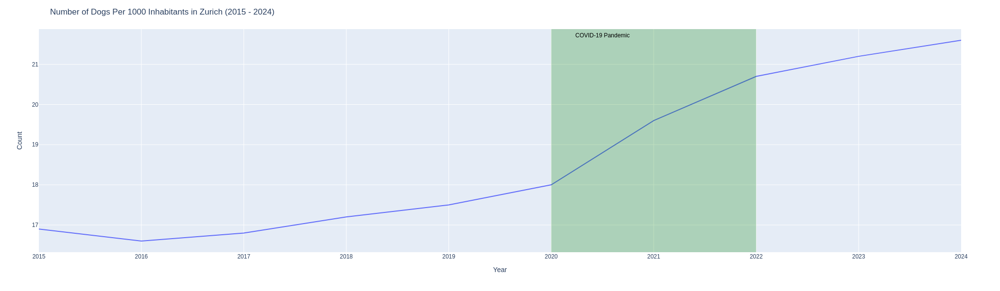

In [27]:
fig_2 = px.line(dogs_zurich_yearly, 
              x="StichtagDatJahr",
              y = "DogsPer1000Inhabitants",
              width=800, height=600)

# Update layout (title and axis labels)
fig_2.update_layout(
    title="Number of Dogs Per 1000 Inhabitants in Zurich (2015 - 2024)",
    xaxis_title="Year",
    yaxis_title="Count")

# Highlight 2020-2022
fig_2.add_vrect(
    x0=2020, x1=2022,
    fillcolor="green",
    opacity=0.25,
    line_width=0)

# Add annotation for COVID-19
fig_2.add_annotation(
    x=2020.5, y=max(dogs_zurich_yearly["DogsPer1000Inhabitants"]),
    text="COVID-19 Pandemic",
    showarrow=False,
    font=dict(size=12, color="black"),
    xanchor="center", yanchor="bottom")

# Ensure every year is shown on the x-axis
all_years = sorted(dogs_zurich_yearly["StichtagDatJahr"])
fig_2.update_xaxes(
    tickmode="array",      # Force specific tick values
    tickvals=all_years,    # List of years     
    )

fig_2.show()

Let's have a look at the development of numbers by district, ward over the years.

### Absolute number of dogs per year for each Stadtkreis from 2015 until now

In [28]:
# drop rows with missing Stadtkreis - there are only 5, which is okay
dogs_clean_district = dogs_zurich_small[dogs_zurich_small.KreisCd != 99]

In [29]:
dogs_yearly_by_district = dogs_clean_district.groupby("KreisCd")["StichtagDatJahr"].value_counts().reset_index(name="CountDistrict").sort_values(by=["KreisCd", "StichtagDatJahr"])

In [30]:
dogs_yearly_by_district['GrowthRate'] = dogs_yearly_by_district.groupby("KreisCd")['CountDistrict'].pct_change(periods=1) * 100 # to calculate the yearly growth rate
dogs_yearly_by_district['GrowthRate'] = dogs_yearly_by_district['GrowthRate'].fillna(0) # set 2015 as starting point with 0

In [31]:
dogs_yearly_by_district.head()

,KreisCd,StichtagDatJahr,CountDistrict,GrowthRate
8,1,2015,117,0.000000
9,1,2016,115,-1.709402
6,1,2017,124,7.826087
4,1,2018,126,1.612903
5,1,2019,125,-0.793651


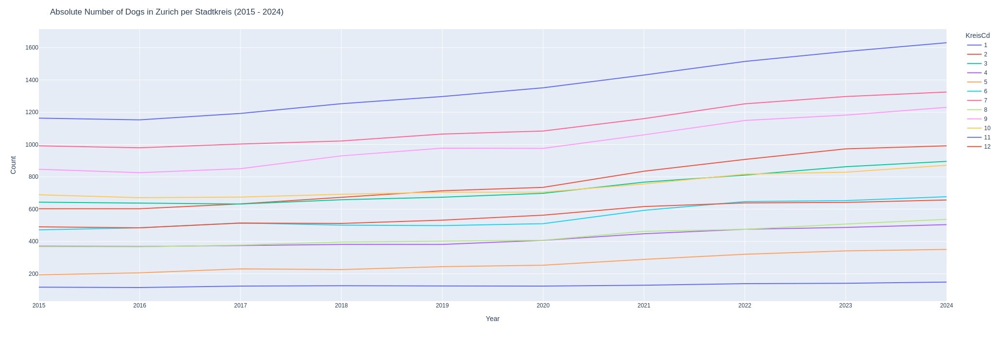

In [32]:
fig_3 = px.line(dogs_yearly_by_district, 
                x="StichtagDatJahr", 
                y="CountDistrict", 
                color="KreisCd",
                width=800, height=700)

fig_3.update_layout(
    title="Absolute Number of Dogs in Zurich per Stadtkreis (2015 - 2024)",
    xaxis_title="Year",
    yaxis_title="Count")

# Ensure every year is shown on the x-axis
all_years = sorted(dogs_zurich_yearly["StichtagDatJahr"])
fig_3.update_xaxes(
    tickmode="array",      # Force specific tick values
    tickvals=all_years,    # List of years     
    )

fig_3.show()

Most registered dogs are to be found in Stadtkreis 11, 7, and 9 - a very constant observation. Lowest number of dogs with not much change has Stadtkreis 1.

It might be interesting to have look at the yearly growth rate as well. 

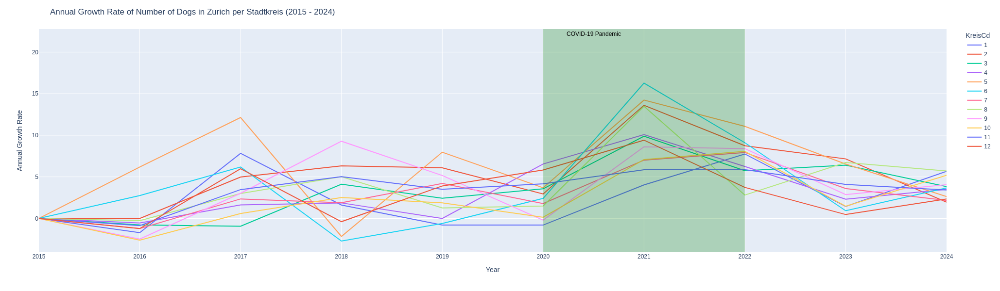

In [33]:
fig_4 = px.line(dogs_yearly_by_district, 
                x="StichtagDatJahr", 
                y="GrowthRate", 
                color="KreisCd",
                width=1200, height=600)

fig_4.update_layout(
    title="Annual Growth Rate of Number of Dogs in Zurich per Stadtkreis (2015 - 2024)",
    xaxis_title="Year",
    yaxis_title="Annual Growth Rate")

# Ensure every year is shown on the x-axis
fig_4.update_xaxes(
    tickmode="array",      # Force specific tick values
    tickvals=all_years,)    # List of years     

# Highlight 2020-2022
fig_4.add_vrect(
    x0=2020, x1=2022,
    fillcolor="green",
    opacity=0.25,
    line_width=0)

# Add annotation for COVID-19
fig_4.add_annotation(
    x=2020.5, y=max(dogs_zurich_yearly["DogsPer1000Inhabitants"]),
    text="COVID-19 Pandemic",
    showarrow=False,
    font=dict(size=12, color="black"),
    xanchor="center", yanchor="bottom")

fig_4.show()

One can see, that the annual growth rate of number of dogs increased for 2020-2021 for all of the boroughs. But for 2021-2022 that picture changed already, with annual growths rates going down for most of the Stadtkreis. So a timespan of growth was actually first lock-downs, when the pandemic started.

It might be better, and more clear to show subplots in some situations. The following code and plots again show the annual growth rate of the number of dogs per district - just in separate plots. 

There are some things to consider - to make the plots comparable. 

Important is:

        -- shared y- and x-axis
        -- shared interval for y- and x-axis
        -- neat subtitles and legends

The period 2020-2022 was added as well.

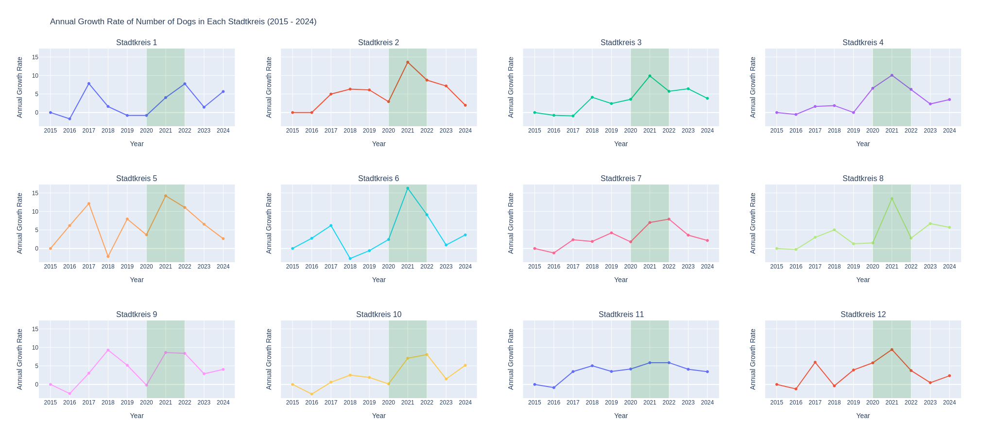

In [34]:
rows = 3
cols = 4

# Get unique districts
districts = dogs_yearly_by_district["KreisCd"].unique()

# Get y-min and y-max to be able to define same interval for y-axis for all plots
y_min = dogs_yearly_by_district["GrowthRate"].min()
y_max = dogs_yearly_by_district["GrowthRate"].max()

# Create subplots: one plot per district
fig_5 = make_subplots(
    rows=rows, cols=cols,  
    shared_xaxes=True, 
    shared_yaxes=True,
    subplot_titles=[f"Stadtkreis {district}" for district in districts])  # Titles for each subplot

# Add a line trace for each district in its respective subplot
for i, district in enumerate(districts):
    district_data = dogs_yearly_by_district[dogs_yearly_by_district["KreisCd"] == district]  # Filter data for the district
    row = (i // cols) + 1  # Determine the row number
    col = (i % cols) + 1   # Determine the column number
    fig_5.add_trace(
        go.Scatter(
            x=district_data["StichtagDatJahr"], 
            y=district_data["GrowthRate"], 
            mode="lines+markers",
            #name=f"District {district}"
        ),
        row=row, col=col)  # Add to the correct subplot
    fig_5.update_xaxes(title="Year", tickmode="array", tickvals=all_years, showticklabels=True)
    fig_5.update_yaxes(title="Annual Growth Rate")

    fig_5.add_vrect(
    x0="2020", x1="2022",
    fillcolor="green", opacity=0.15, line_width=0,
    xref=f"x{i+1}", yref=f"y{i+1}"  # Specify the exact axis reference
    )


# Update layout
fig_5.update_layout(
    height=300 * rows,  # Adjust the height of the figure based on the number of subplots
    width=500 * cols,
    title="Annual Growth Rate of Number of Dogs in Each Stadtkreis (2015 - 2024)",
    showlegend=False)             # Disable legend (optional, since subplot titles suffice)    

# here we define the y-axis interval for all plots, rows to be the same
fig_5.update_yaxes(range=[y_min-1, y_max+1])

# Show the figure
fig_5.show()


## The Year 2023 in More Detail

While absolute numbers can give a good first impression, it might make sense to add some more statistical power by working with percentages (like done with the growth rate), or other ratios to compare each Stadtkreis - like dog per inhabitant or dog per square meter. Let's do that for the most recent complete data which is available, that is for the year 2023.

In [35]:
dogs_2023 = dogs_zurich_small[dogs_zurich_small.StichtagDatJahr == 2023]
dogs_2023 = dogs_2023[dogs_2023.KreisCd != 99]

In [36]:
dogs_2023.head()

,StichtagDatJahr,HalterId,AlterV10Lang,SexLang,KreisCd,QuarCd,Rasse1Text,RasseMischlingCd,RassentypLang,GebDatHundJahr,SexHundLang,HundefarbeText
61472,2023,574,70- bis 79-Jährige,weiblich,2,23,Unbekannt,4,Rassentypenliste I,2013,weiblich,schwarz
61473,2023,695,50- bis 59-Jährige,männlich,6,63,Labrador Retriever,1,Rassentypenliste I,2012,weiblich,braun
61474,2023,893,70- bis 79-Jährige,weiblich,7,71,Mittelschnauzer,1,Rassentypenliste I,2010,weiblich,schwarz
61475,2023,1177,60- bis 69-Jährige,männlich,10,102,Shih Tzu,1,Kleinwüchsig,2011,männlich,schwarz/weiss
61476,2023,4054,50- bis 59-Jährige,weiblich,11,111,Lagotto Romagnolo,1,Rassentypenliste I,2016,weiblich,weiss/beige


In [37]:
dogs_2023_stadtkreis = dogs_2023.KreisCd.value_counts().reset_index()

In [38]:
district_info = pd.DataFrame(
    {
        "district" : [x for x in range(1, 13)], 
        "area" : [1.8, 11.07, 8.65, 2.9, 1.99, 5.1, 15.02, 4.81, 12.07, 9.09, 13.42, 5.97], 
        "pop" : [5890, 37639, 50950, 29944, 15874, 35688, 39647, 17860, 59841, 41411, 78801, 35537]})

In [39]:
dogs_2023_stadtkreis = pd.merge(
    dogs_2023_stadtkreis, 
    district_info, 
    left_on="KreisCd", 
    right_on="district").drop("district", axis=1)

dogs_2023_stadtkreis["dogs_per_km2"] = round(
    dogs_2023_stadtkreis["count"]/dogs_2023_stadtkreis["area"])

dogs_2023_stadtkreis["dogs_per_1000inhab"] = round(
    (dogs_2023_stadtkreis["count"]/dogs_2023_stadtkreis["pop"])*1000)

dogs_2023_stadtkreis

,KreisCd,count,area,pop,dogs_per_km2,dogs_per_1000inhab
0,11,1576,13.42,78801,117.0,20.0
1,7,1297,15.02,39647,86.0,33.0
2,9,1182,12.07,59841,98.0,20.0
3,2,973,11.07,37639,88.0,26.0
4,3,863,8.65,50950,100.0,17.0
5,10,829,9.09,41411,91.0,20.0
6,6,653,5.10,35688,128.0,18.0
7,12,642,5.97,35537,108.0,18.0
8,8,508,4.81,17860,106.0,28.0
9,4,487,2.90,29944,168.0,16.0


### Visualization using geo plots

Important: We need keys to match the DataFrame with the geojson file - to get the city and its boroughs right. In this case it is properties.name from the zurich geojson file and the "STADTKREIS" column from our dogs_2023 DataFrame. Doing an update to focus just on Zurich and not the entire world map.

In [40]:
zurich_geojson_path = data_folder / "stzh.adm_stadtkreise_a.json"

In [41]:
with open(zurich_geojson_path) as f:
    zurich = json.load(f)

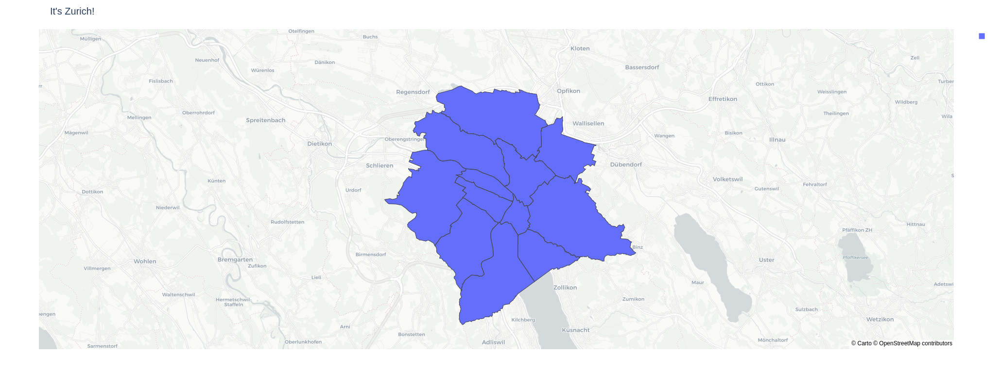

In [42]:
fig_6 = px.choropleth_mapbox(
    dogs_2023, 
    geojson=zurich, 
    locations="KreisCd", 
    featureidkey="properties.name", 
    #projection="mercator",  
    mapbox_style="carto-positron")

fig_6.update_geos(fitbounds="locations", visible=False)
fig_6.update_layout(mapbox_zoom=11, mapbox_center = {"lat": 47.3852, "lon": 8.5269})
fig_6.update_layout(title={"text" : "It's Zurich!", "font" : {"size" : 20}})
fig_6.update_layout(autosize=False, width=800, height=800)
fig_6.show()

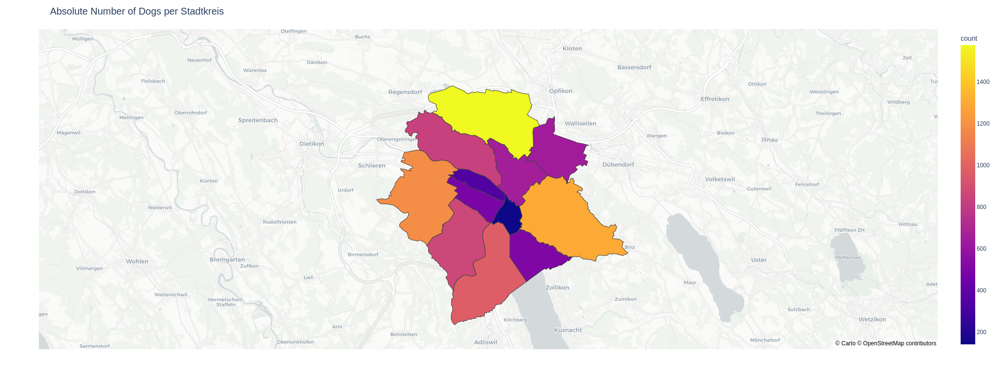

In [43]:
fig_7 = px.choropleth_mapbox(
    dogs_2023_stadtkreis, 
    geojson=zurich,
    color="count",
    locations="KreisCd", 
    featureidkey="properties.name",  
    mapbox_style="carto-positron")

fig_7.update_geos(fitbounds="locations", visible=False)
fig_7.update_layout(mapbox_zoom=11, mapbox_center = {"lat": 47.3852, "lon": 8.5269})
fig_7.update_layout(title={"text" : "Absolute Number of Dogs per Stadtkreis", "font" : {"size" : 20}})
fig_7.update_layout(autosize=False, width=800, height=800)

fig_7.show()

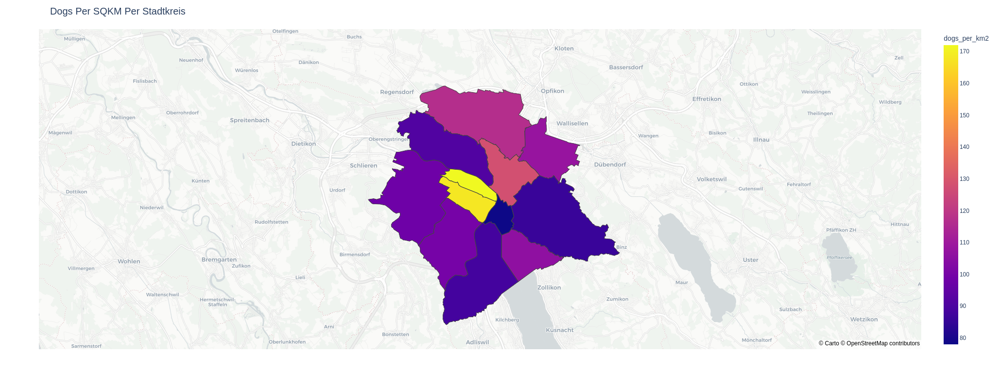

In [44]:
fig_8 = px.choropleth_mapbox(
    dogs_2023_stadtkreis, 
    geojson=zurich,
    color="dogs_per_km2",
    locations="KreisCd", 
    featureidkey="properties.name",  
    mapbox_style="carto-positron")

fig_8.update_geos(fitbounds="locations", visible=False)
fig_8.update_layout(mapbox_zoom=11, mapbox_center = {"lat": 47.3852, "lon": 8.5269})
fig_8.update_layout(title={"text" : "Dogs Per SQKM Per Stadtkreis", "font" : {"size" : 20}})
fig_8.update_layout(autosize=False, width=800, height=800,)

fig_8.show()

**Result**

And that is a totally different picture. In relation to the area, there are more dogs registered in central Zurich. Stadtkreis 11 is now on 4th place.

Let's have a look at number of registered dogs per 1000 inhabitants.

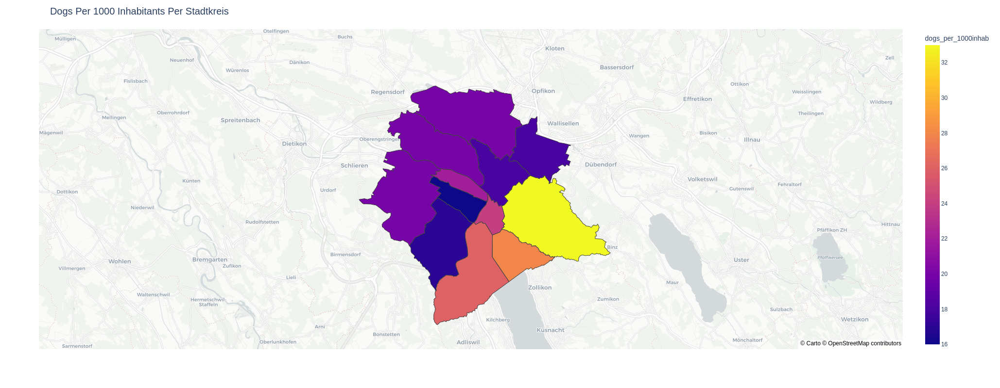

In [46]:
fig_9 = px.choropleth_mapbox(
    dogs_2023_stadtkreis, 
    geojson=zurich,
    color="dogs_per_1000inhab",
    locations="KreisCd", 
    featureidkey="properties.name",  
    mapbox_style="carto-positron")

fig_9.update_geos(fitbounds="locations", visible=False)
fig_9.update_layout(mapbox_zoom=11, mapbox_center = {"lat": 47.3852, "lon": 8.5269})
fig_9.update_layout(title={"text" : "Dogs Per 1000 Inhabitants Per Stadtkreis", "font" : {"size" : 20}})
fig_9.update_layout(autosize=False, width=900, height=800,)

fig_9.show()

**Results**

And again we get another picture. Stadtkreis 7, 8 and 2 have most registered dogs per 1000 inhabitants. Stadtkreis 7 has the biggest area of all boroughs in Zurich, while at the same time having half of the number of the inhabitants of the second biggest borough, which is Stadtkreis 11. So just from the data one might assume, that Stadtkreis 7 has rather smaller apartment houses, if not lots of single-family homes and lots of families are having a dog. 

In [ ]:
missing_breed = dogs.groupby("StichtagDatJahr")["Rasse1Text"].apply(lambda x: (x=="Unbekannt").sum()).reset_index(name="MissingBreedCount")

In [ ]:
missing_breed

In [ ]:
combined_df = pd.merge(dogs_count, missing_breed, on="StichtagDatJahr")
combined_df["PercentageMissingBreed"] = (combined_df["MissingBreedCount"] / combined_df["AbsoluteNumber"])

In [ ]:
combined_df